In [47]:
from fastai import *
from fastai.vision import *
from fastai.callbacks.hooks import *

from ranger import Ranger
from tqdm.notebook import tqdm

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from matplotlib.offsetbox import OffsetImage, AnnotationBbox


%matplotlib inline


seed = 12345

In [2]:
PATH = os.path.abspath('../../alfalfa-convnets')

sys.path.append(f'{PATH}/src')

from mxresnet import *


Mish activation loaded...
Mish activation loaded...


In [3]:
df = pd.read_csv(f'{PATH}/data/xGASS_representative_sample.csv')

image_stats = [tensor([-0.0169, -0.0105, -0.0004]), tensor([0.9912, 0.9968, 1.0224])]

tfms = get_transforms(
    do_flip=True,
    flip_vert=True,
    max_zoom=1.0,
    max_rotate=15.0,
    max_lighting=0,
    max_warp=0,
)

bs = 32
sz = 224

src = (ImageList.from_df(df, path=PATH, folder='images-xGASS', suffix='.jpg', cols='GASS')
                .split_by_rand_pct(0.2, seed=seed)
                .label_from_df(cols=['lgGF'])
      )

data = (src.transform(tfms, size=sz)
            .databunch(bs=bs)
            .normalize(image_stats)
       )


# Find galaxies in PCA space for some input galaxy

In [8]:
idx = 42

print(data.valid_dl.items[idx])

/home/jupyter/alfalfa-convnets/images-xGASS/101026.jpg


In [14]:
data.valid_ds[idx]

(Image (3, 224, 224), FloatItem 0.562)

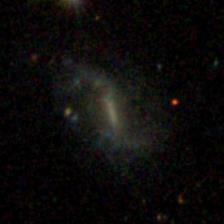

In [9]:
img = open_image(data.valid_dl.items[idx])
img

In [15]:
valid_acts_PCA = np.load(f'../results/valid_acts_PCA.npy')
valid_acts_PCA[idx]

array([ 1.624611, -0.0454  ,  0.213429])

Find separations from other systems

In [25]:
# euclidean dist
dist = lambda x, y: ((x-y)**2).sum(1)**0.5

In [31]:
# list of separations
seps = dist(valid_acts_PCA[idx], valid_acts_PCA)
display(seps.shape)         # should be len(data.valid_ds)
display(seps.argmin())      # should be idx above
display(seps[42])           # should be 0

(235,)

42

In [35]:
nearest = seps.argsort()[1:5]

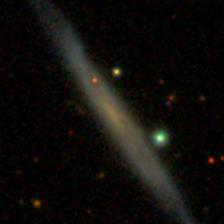

0.542 [1.503684 0.010386 0.324222]


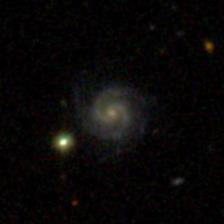

-0.018 [1.643069 0.096244 0.33293 ]


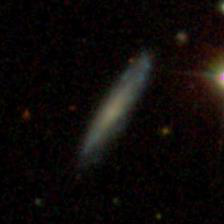

0.153 [ 1.487157 -0.17521   0.165474]


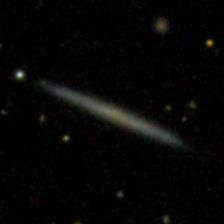

0.169 [1.747457 0.081329 0.123605]


In [39]:
for n in nearest:
    img = open_image(data.valid_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(data.valid_ds[n][1], valid_acts_PCA[n])

Interestingly, there are some similarities but also considerable differences. Then again only 235 galaxies are in this subsample. Let's see what happens if we only consider nearest neighbors in the $e_2$ and $e_3$ vectors but **not** $e_1$ (which we expect to be most correlated with gas mass frac).

In [42]:
valid_acts_e2e3 = valid_acts_PCA[:, 1:3]
valid_acts_e2e3.shape

(235, 2)

In [43]:
seps = dist(valid_acts_e2e3[idx], valid_acts_e2e3)
nearest = seps.argsort()[0:5]  # include original

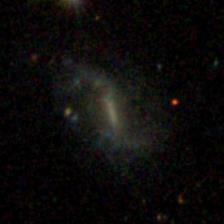

0.562 [-0.0454    0.213429]


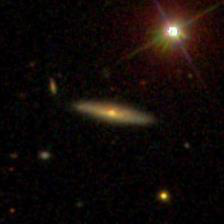

-1.106 [-0.046762  0.180683]


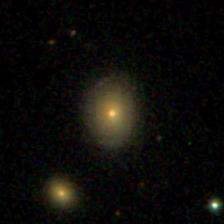

-1.169 [0.010681 0.151181]


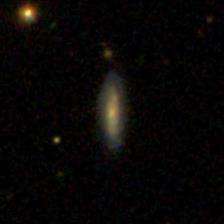

-0.582 [-0.115766  0.262607]


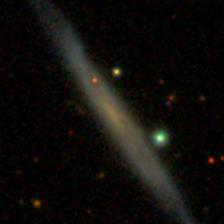

0.542 [0.010386 0.324222]


In [45]:
for n in nearest:
    img = open_image(data.valid_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(data.valid_ds[n][1], valid_acts_e2e3[n])

That's even more strange; why is there so much variance in the gas mass fraction **and** morphology? Let's only try $e_1$ this time

In [51]:
valid_acts_e1 = valid_acts_PCA[:, 0]

seps = dist(valid_acts_e1[idx, np.newaxis], valid_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

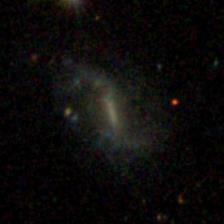

0.562 1.6246113285846484 [-0.0454    0.213429]


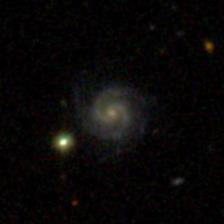

-0.018 1.643068787832868 [0.096244 0.33293 ]


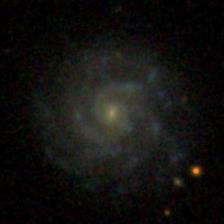

-0.026 1.5982179602825484 [ 0.565806 -0.439398]


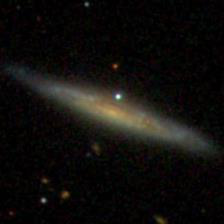

-0.198 1.5931347985836566 [0.213568 0.121084]


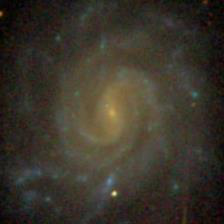

-0.318 1.5826306868047428 [-0.241193  2.259642]


In [53]:
for n in nearest:
    img = open_image(data.valid_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(data.valid_ds[n][1], valid_acts_e1[n], valid_acts_e2e3[n])

Great! So we do want $e_1$ after all. And note that there is still interesting variance in gas mass fraction.

## More tests

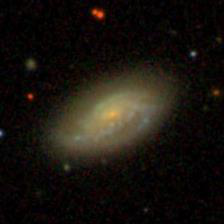

99 -1.095 0.04432195552462853 [-0.331305  0.258695]


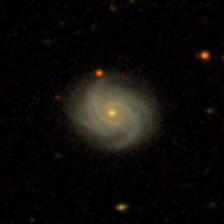

159 -0.743 0.03964295032376659 [-0.293167 -0.082761]


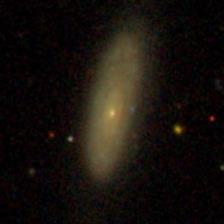

71 -1.105 0.05568759200206218 [-0.180777  0.304297]


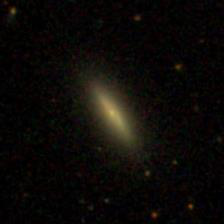

128 -1.709 0.05977313332505243 [-0.376651 -0.052031]


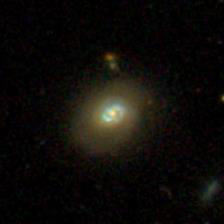

103 -0.83 0.06971157081395163 [-0.168067  0.141904]


In [66]:
idx = 99

seps = dist(valid_acts_e1[idx, np.newaxis], valid_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

for n in nearest:
    img = open_image(data.valid_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.valid_ds[n][1], valid_acts_e1[n], valid_acts_e2e3[n])

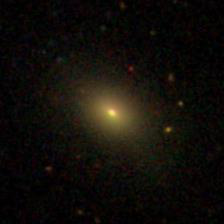

155 -1.831 -0.8706891588651211 [ 0.153891 -0.133433]


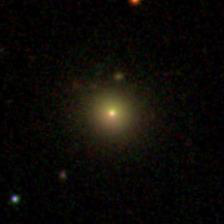

135 -1.612 -0.8742409243724519 [ 0.035666 -0.09719 ]


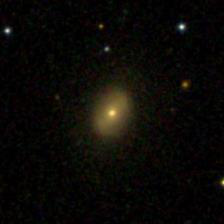

94 -1.86 -0.877117447832079 [ 0.036349 -0.202968]


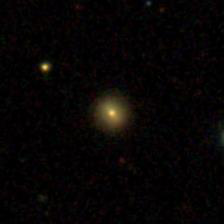

57 -1.261 -0.8873871093952486 [ 0.052317 -0.130895]


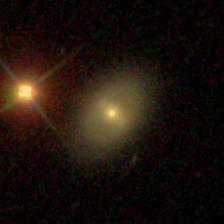

209 -1.377 -0.9039626983735676 [0.162233 0.303108]


In [65]:
idx = 155

seps = dist(valid_acts_e1[idx, np.newaxis], valid_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

for n in nearest:
    img = open_image(data.valid_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.valid_ds[n][1], valid_acts_e1[n], valid_acts_e2e3[n])

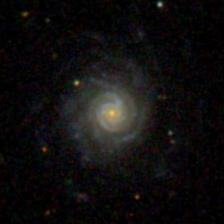

18 -0.161 1.4897338638391249 [ 0.871301 -0.255984]


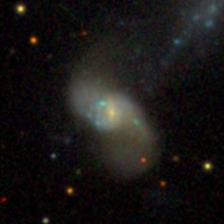

130 0.392 1.4883927940609352 [ 0.816594 -0.068179]


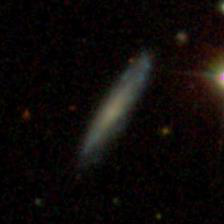

153 0.153 1.4871568586939472 [-0.17521   0.165474]


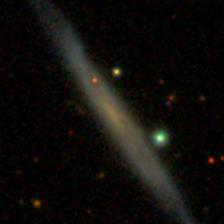

30 0.542 1.5036839752691409 [0.010386 0.324222]


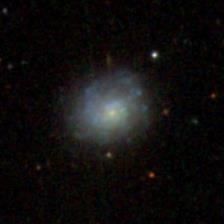

98 0.055 1.5115502443550153 [ 0.3212   -0.111789]


In [63]:
idx = 18

seps = dist(valid_acts_e1[idx, np.newaxis], valid_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

for n in nearest:
    img = open_image(data.valid_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.valid_ds[n][1], valid_acts_e1[n], valid_acts_e2e3[n])

# Also test with training set

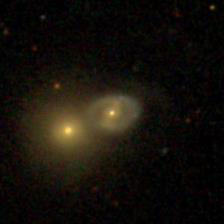

In [69]:
idx = 42

train_acts_PCA = np.load(f'../results/train_acts_PCA.npy')
open_image(data.train_dl.items[idx])

In [70]:
train_acts_e1 = train_acts_PCA[:, 0]
train_acts_e2e3 = train_acts_PCA[:, 1:3]

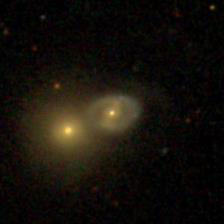

42 -1.229 -0.31746739974467536 [-0.064086  0.671193]


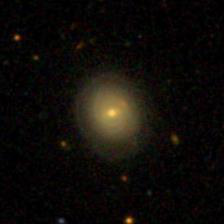

540 -1.224 -0.31936730109884875 [-0.164333 -0.151325]


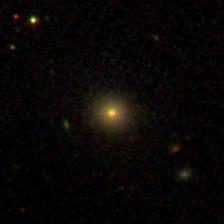

933 -1.74 -0.32406181049543675 [-0.217811 -0.16305 ]


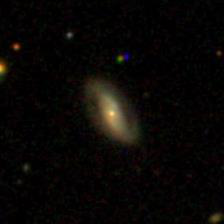

435 -1.209 -0.3274742257686996 [-0.230388 -0.110643]


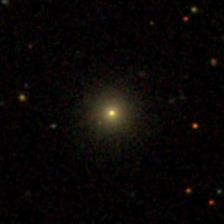

560 -1.631 -0.33028278531136973 [-0.267078 -0.215187]


In [72]:
seps = dist(train_acts_e1[idx, np.newaxis], train_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 


for n in nearest:
    img = open_image(data.train_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.train_ds[n][1], train_acts_e1[n], train_acts_e2e3[n])

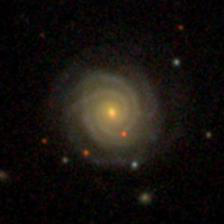

108 -1.146 0.1949783259741852 [ 0.127381 -0.233959]


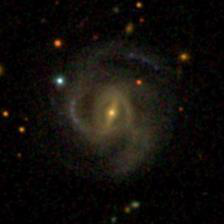

120 -0.772 0.1922438263540007 [ 0.200148 -0.290459]


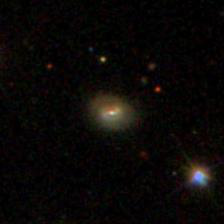

532 -1.071 0.198004061628366 [-0.410207 -0.019809]


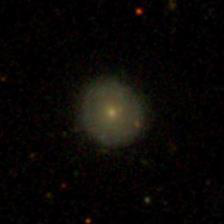

170 -1.043 0.19122080602930025 [-0.495105 -0.319502]


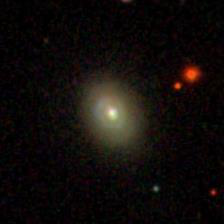

584 -0.673 0.2024696370666939 [-0.309324  0.090639]


In [73]:
idx = 108

seps = dist(train_acts_e1[idx, np.newaxis], train_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

for n in nearest:
    img = open_image(data.train_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.train_ds[n][1], train_acts_e1[n], train_acts_e2e3[n])

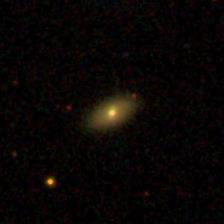

1 -1.381 -1.1007132102786203 [0.166079 0.068659]


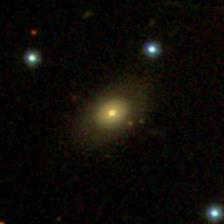

722 -1.688 -1.1011850370340455 [0.479124 0.474614]


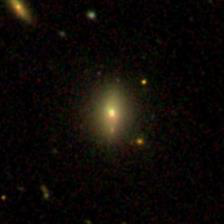

191 -1.726 -1.100107741411933 [0.248941 0.268548]


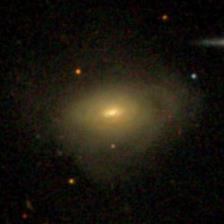

828 -1.785 -1.1014381291877227 [ 0.118107 -0.210236]


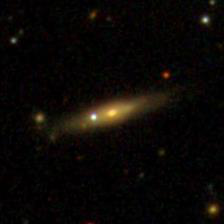

519 -1.806 -1.1020883958752343 [ 0.030165 -0.197061]


In [77]:
idx = 1

seps = dist(train_acts_e1[idx, np.newaxis], train_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

for n in nearest:
    img = open_image(data.train_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.train_ds[n][1], train_acts_e1[n], train_acts_e2e3[n])

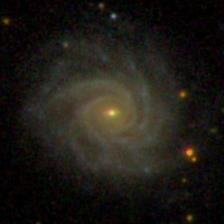

685 -0.843 0.44073913943668636 [ 0.351029 -0.19624 ]


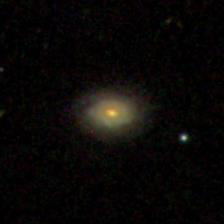

74 -0.641 0.437693910964275 [-0.096242  0.045263]


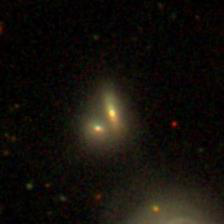

475 -0.623 0.437228292605544 [-0.422955  0.294338]


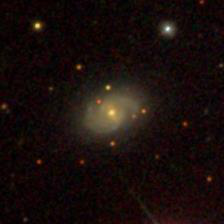

136 -0.867 0.4473141333790394 [-0.311577 -0.02796 ]


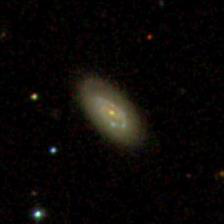

903 -1.085 0.43237577737239496 [-0.442989  0.029035]


In [85]:
idx = 685

seps = dist(train_acts_e1[idx, np.newaxis], train_acts_e1[:, np.newaxis])
nearest = seps.argsort()[0:5] 

for n in nearest:
    img = open_image(data.train_dl.items[n])
    display(img)
    
    # also print log gas fraction
    print(n, data.train_ds[n][1], train_acts_e1[n], train_acts_e2e3[n])

# Repeat with Legacy imaging

In [91]:
src = (ImageList.from_df(df, path=PATH, folder='images-xGASS-legacy', suffix='.jpg', cols='GASS')
                .split_by_rand_pct(0.2, seed=seed)
                .label_from_df(cols=['lgGF'])
      )

data = (src.transform(tfms, size=sz)
            .databunch(bs=bs)
            .normalize(image_stats)
       )


In [92]:
model = mxresnet34()
model[-1] = nn.Linear(model[-1].in_features, 1, bias=True) #.cuda()

In [93]:
learn = Learner(
    data,
    model=model,
    opt_func=partial(Ranger),
    loss_func=root_mean_squared_error,
    wd=1e-3,
    bn_wd=False,
    true_wd=True,
)

In [94]:
learn.load(f'/home/jupyter/alfalfa-convnets/models/xgass-legacy');

set state called


In [95]:
m = learn.model.eval();

In [96]:
N_valid = len(data.valid_ds)


valid_acts = np.zeros(shape=(N_valid, 512))

# grab all activations for validation set
for i, fn in tqdm(enumerate(data.valid_dl.items), total=N_valid):
    img = open_image(fn);
        
    # get single item
    X, _ = learn.data.one_item(img)
    
    # save activations before final linear layer
    with hook_output(model[-2]) as hook_a:
        pred = m(X.cuda())
    
        valid_acts[i] = hook_a.stored[0].cpu().numpy()

In [97]:
valid_acts_PCA = PCA(n_components=10).fit_transform(valid_acts)

In [162]:
# np.save(f'../results/valid_acts_PCA-legacy.npy', valid_acts_PCA)
valid_acts_PCA = np.load(f'../results/valid_acts_PCA-legacy.npy')

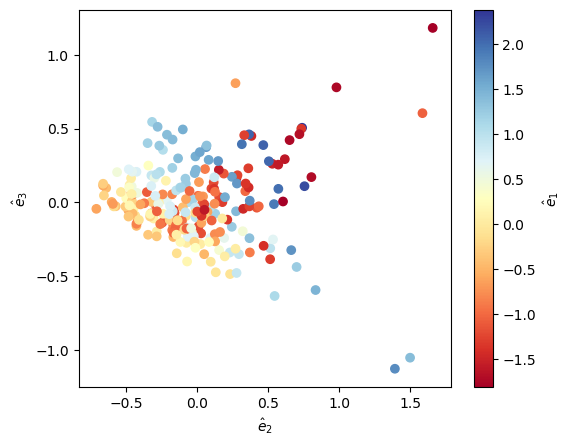

In [163]:
plt.figure(figsize=(6, 5), dpi=100)
plt.scatter(valid_acts_PCA[:, 1], valid_acts_PCA[:, 2], c=valid_acts_PCA[:, 0], cmap='RdYlBu')

cb = plt.colorbar()

cb.set_label(r'$\hat e_1$')
plt.xlabel(r'$\hat e_2$')
plt.ylabel(r'$\hat e_3$');

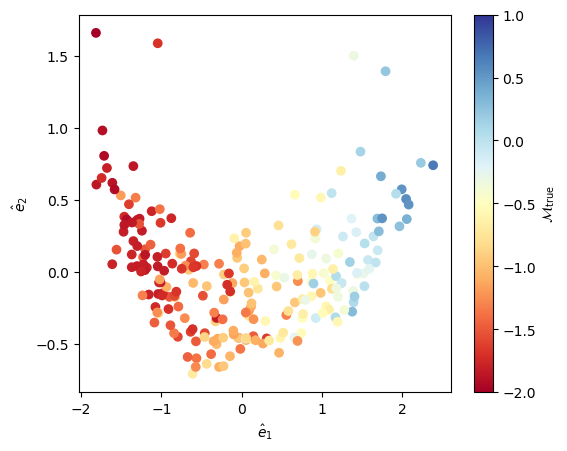

In [164]:
plt.figure(figsize=(6, 5), dpi=100)
plt.scatter(valid_acts_PCA[:, 0], valid_acts_PCA[:, 1], c=data.valid_ds.y.items, 
           vmin=-2, vmax=1, cmap='RdYlBu')

cb = plt.colorbar()

cb.set_label(r'$\mathcal{M}_{\rm true}$')
plt.xlabel(r'$\hat e_1$')
plt.ylabel(r'$\hat e_2$');

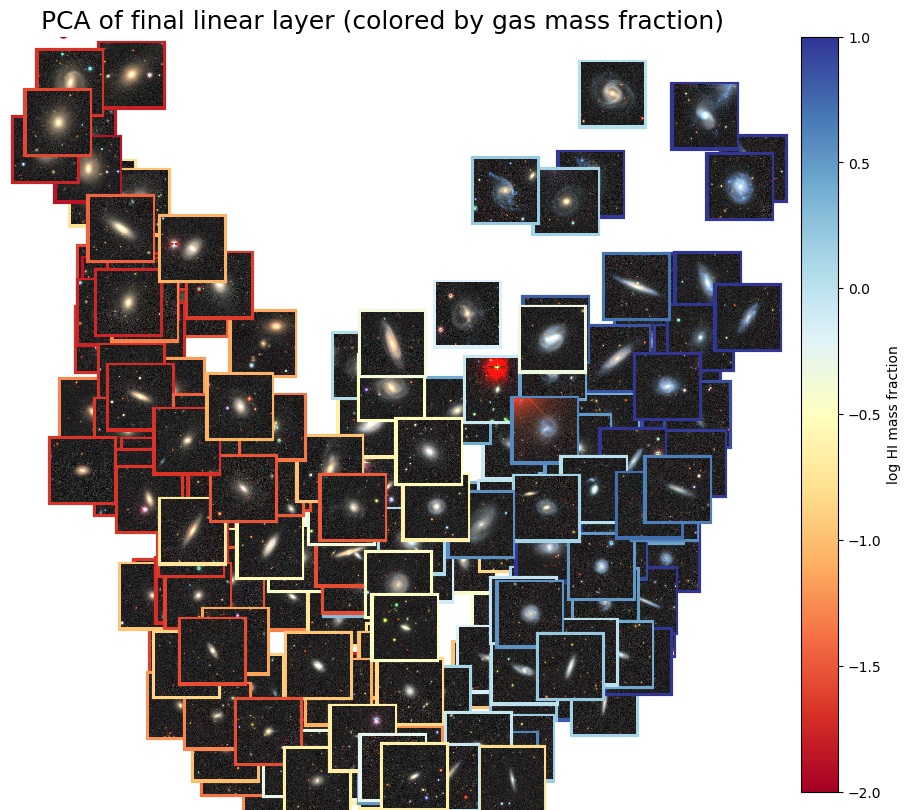

In [165]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10), dpi=100)

sc = ax.scatter(valid_acts_PCA[:, 0], valid_acts_PCA[:, 1], c=data.valid_ds.y.items, 
           vmin=-2, vmax=1, cmap='RdYlBu')


plt.title('PCA of final linear layer (colored by gas mass fraction)', fontsize=18)

artists = []
for fname, lgGF, [x, y] in zip(data.valid_dl.items, data.valid_ds.y.items, valid_acts_PCA[:, 0:2]):
    ab = AnnotationBbox(
        OffsetImage(image2np(open_image(fname).data), zoom=0.1), 
        (x, y), 
        xycoords='data', 
        frameon=True, 
        pad=0.1, 
        bboxprops=dict(linewidth=3, edgecolor=plt.cm.RdYlBu((lgGF/2+1)))
    )
    artists.append(ax.add_artist(ab))
plt.axis('off')

ax.set_xlim(-2, 2)
ax.set_ylim(-0.5, 0.8)
    
plt.colorbar(sc, label='log HI mass fraction')


# Try t-SNE

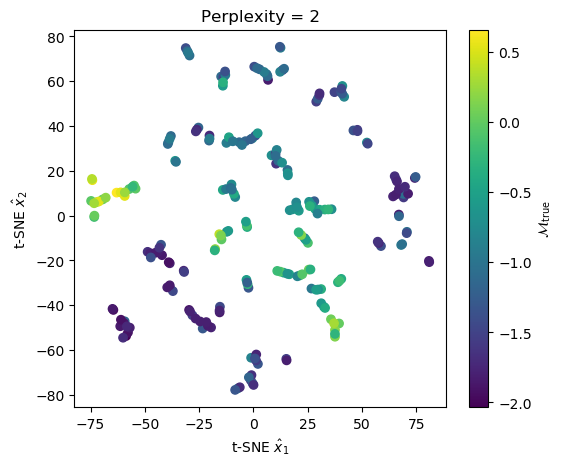

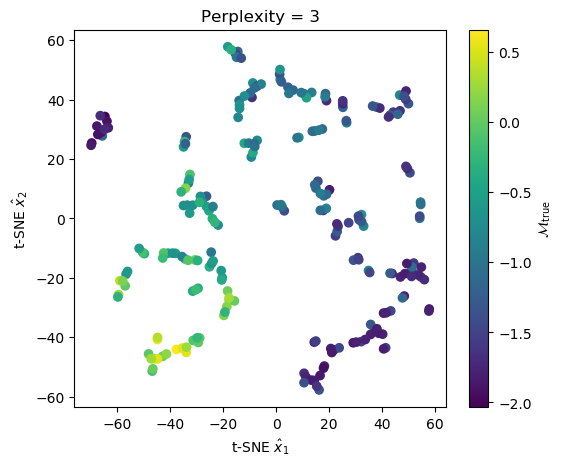

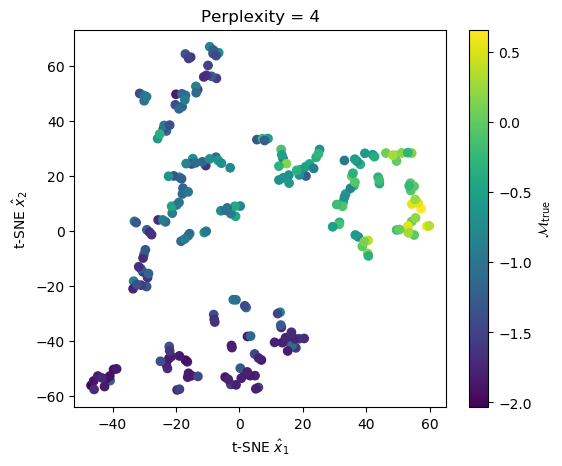

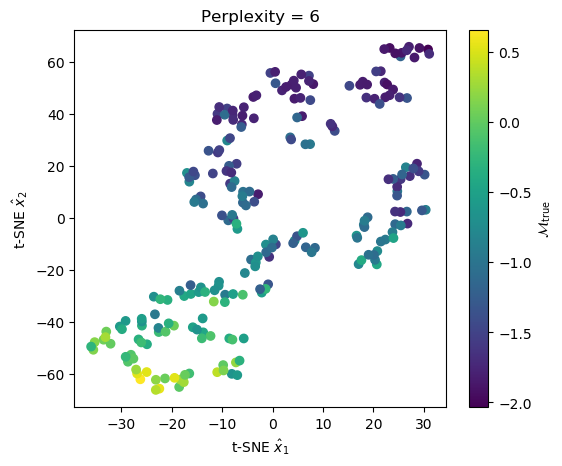

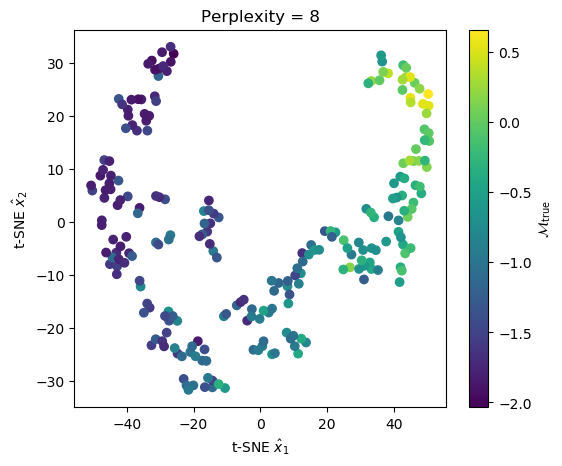

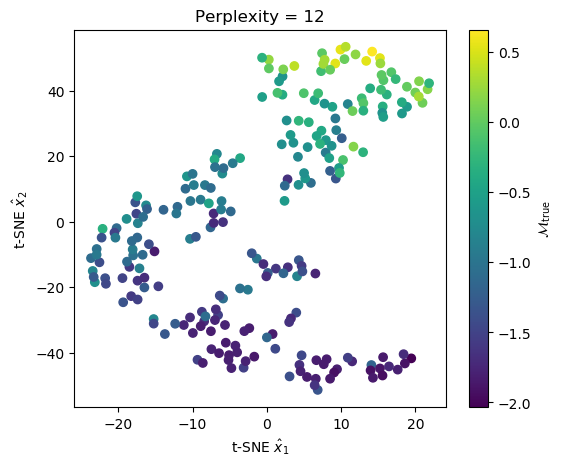

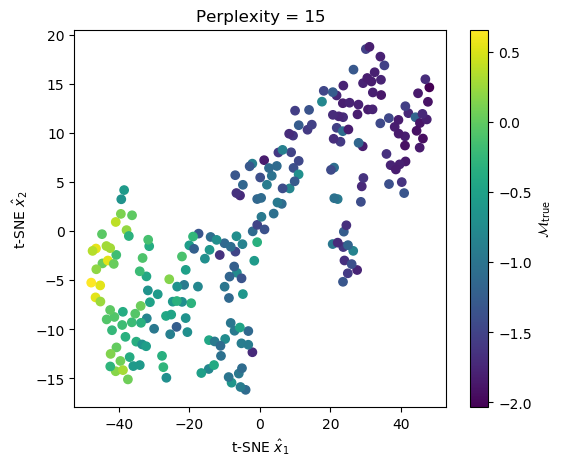

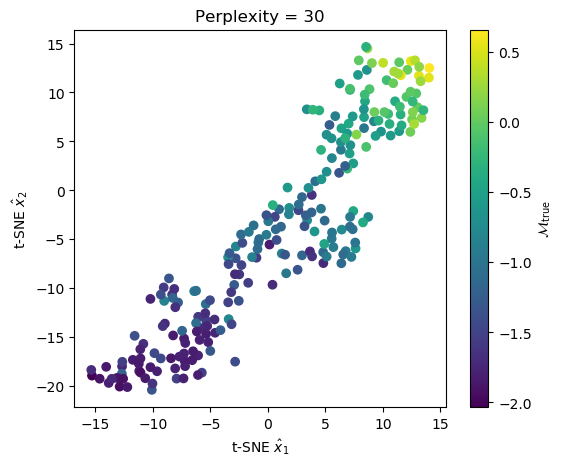

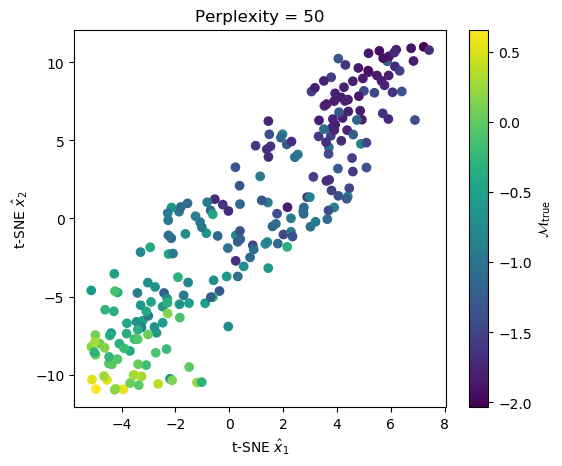

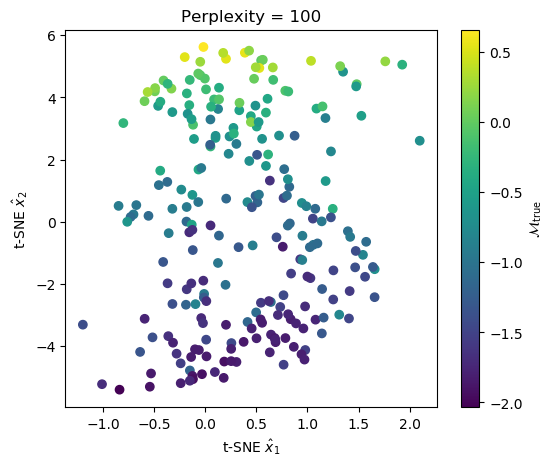

In [106]:
for perplexity in [2, 3, 4, 6, 8, 12, 15, 30, 50, 100]:
    valid_acts_tsne = TSNE(n_components=2, perplexity=perplexity).fit_transform(valid_acts)

    plt.figure(figsize=(6, 5), dpi=100)
    plt.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items)

    cb = plt.colorbar()

    plt.title(f'Perplexity = {perplexity}')
    cb.set_label(r'$\mathcal{M}_{\rm true}$')
    plt.xlabel(r't-SNE $\hat x_1$')
    plt.ylabel(r't-SNE $\hat x_2$')

    plt.show()

# Make similar plot (t-SNE, perplexity=100) and also show image

In [169]:
valid_acts_tsne = TSNE(n_components=2, perplexity=150).fit_transform(valid_acts)


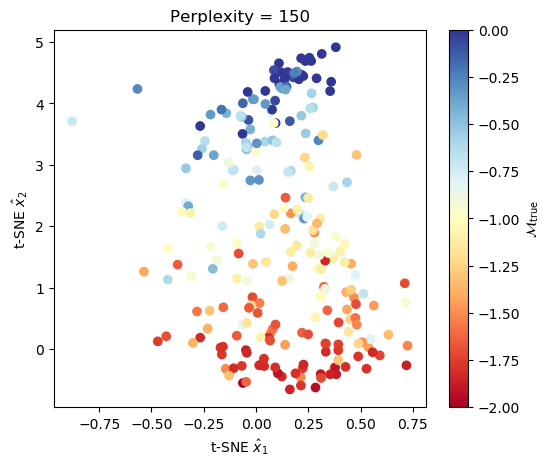

In [170]:
plt.figure(figsize=(6, 5), dpi=100)
plt.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items, cmap='RdYlBu', vmin=-2, vmax=0)

cb = plt.colorbar()

plt.title(f'Perplexity = 150')
cb.set_label(r'$\mathcal{M}_{\rm true}$')
plt.xlabel(r't-SNE $\hat x_1$')
plt.ylabel(r't-SNE $\hat x_2$')

plt.show()

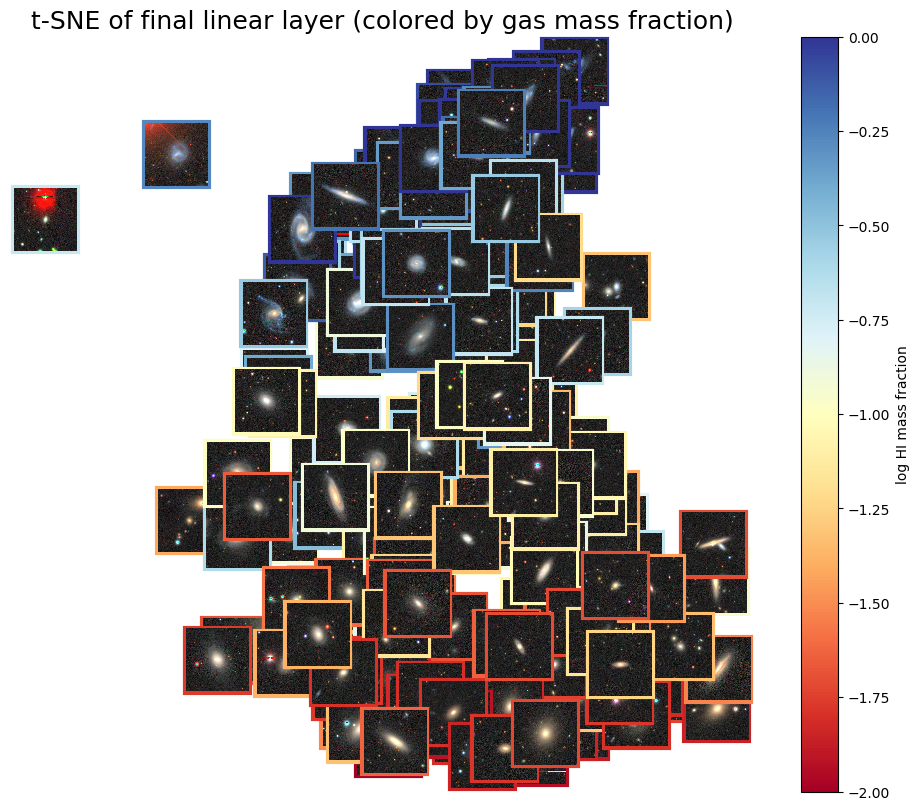

In [171]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10), dpi=100)

sc = ax.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items, 
           vmin=-2, vmax=0, cmap='RdYlBu')


plt.title('t-SNE of final linear layer (colored by gas mass fraction)', fontsize=18)

artists = []
for fname, lgGF, [x, y] in zip(data.valid_dl.items, data.valid_ds.y.items, valid_acts_tsne):
    ab = AnnotationBbox(
        OffsetImage(image2np(open_image(fname).data), zoom=0.1), 
        (x, y), 
        xycoords='data', 
        frameon=True, 
        pad=0.1, 
        bboxprops=dict(linewidth=3, edgecolor=plt.cm.RdYlBu((lgGF/2+1)))
    )
    artists.append(ax.add_artist(ab))
plt.axis('off')


    
plt.colorbar(sc, label='log HI mass fraction')


# Try to hook post-conv layers and redo tSNE

In [172]:
target_layer = m[7][-1].convs[-1]

In [173]:
valid_acts = np.zeros(shape=(N_valid, 512*7*7))

# grab all activations for validation set
for i, fn in tqdm(enumerate(data.valid_dl.items), total=N_valid):
    img = open_image(fn);
        
    # get single item
    X, _ = learn.data.one_item(img)
    
    # save activations before final linear layer
    with hook_output(target_layer) as hook_a:
        pred = m(X.cuda())
    
        valid_acts[i] = hook_a.stored[0].cpu().numpy().reshape(-1)

In [174]:
valid_acts.shape

(235, 25088)

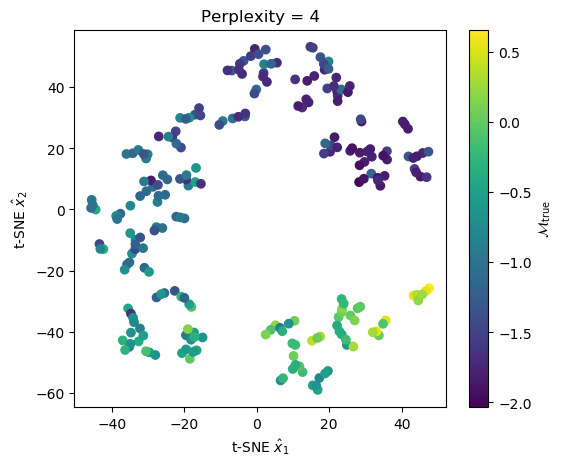

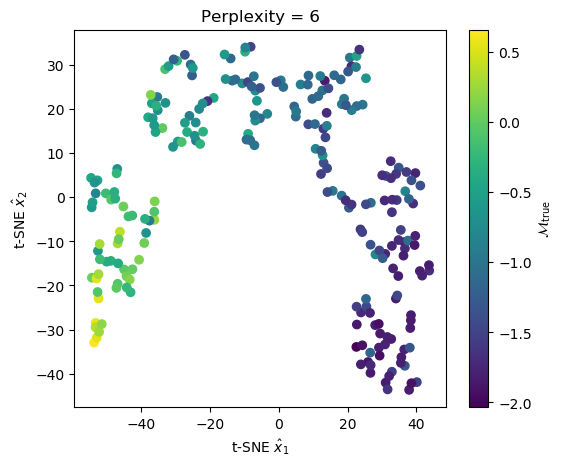

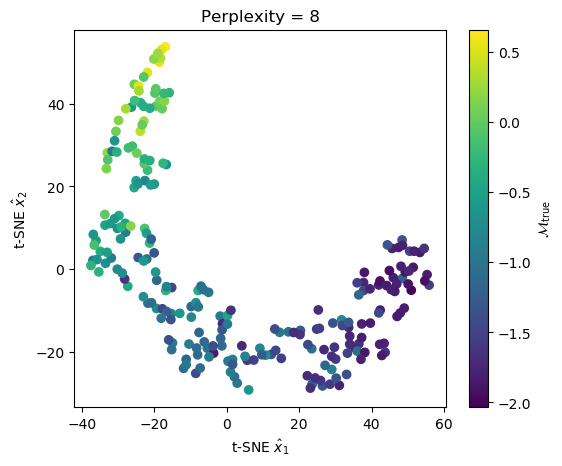

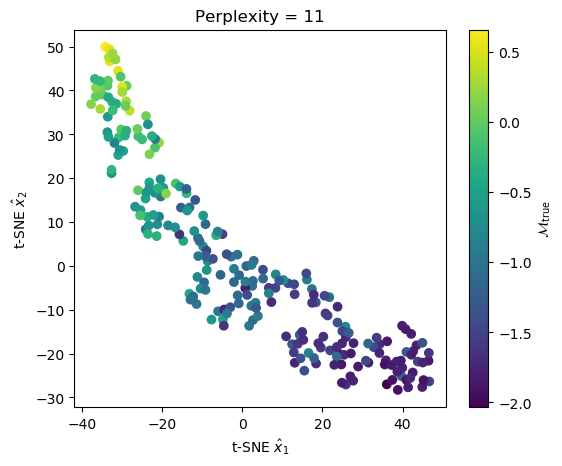

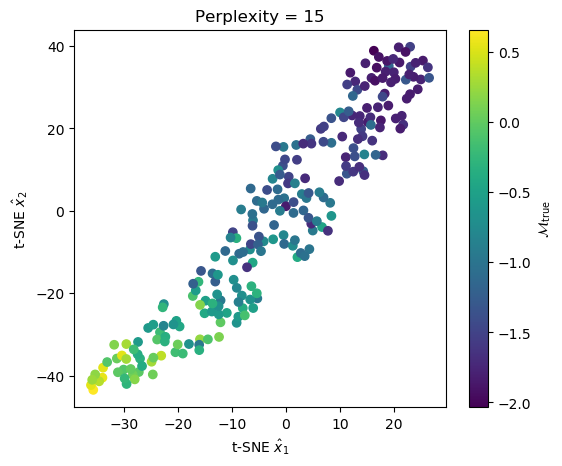

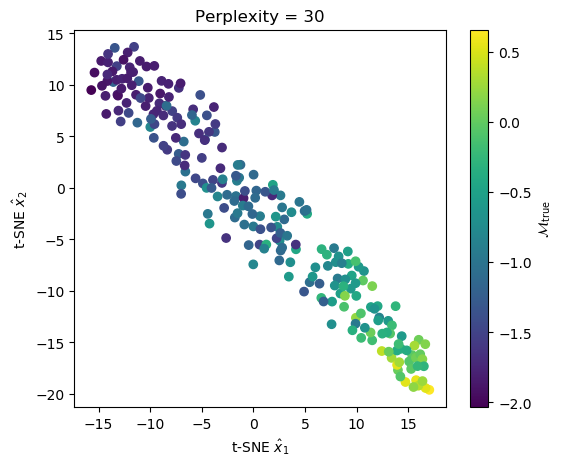

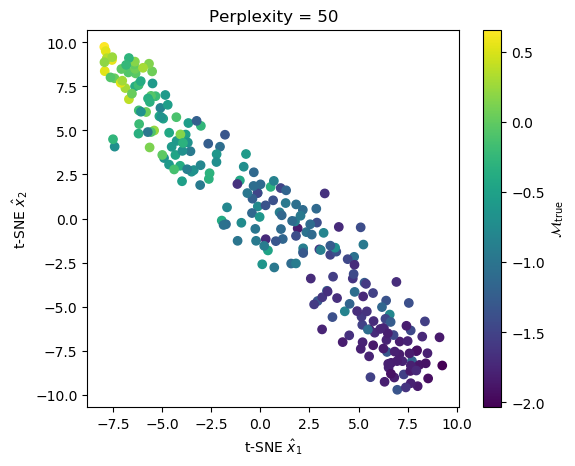

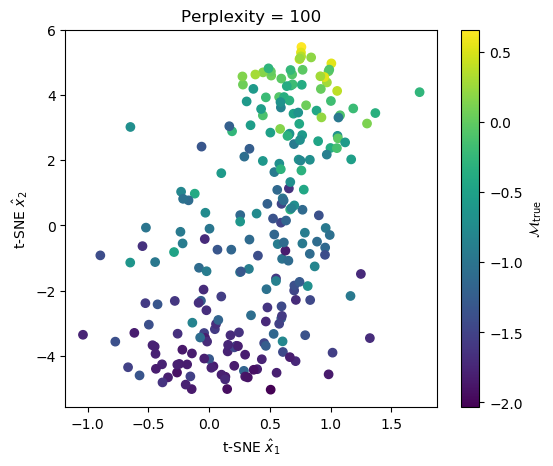

In [140]:
for perplexity in [4, 6, 8, 11, 15, 30, 50, 100]:
    valid_acts_tsne = TSNE(n_components=2, perplexity=perplexity).fit_transform(valid_acts)

    plt.figure(figsize=(6, 5), dpi=100)
    plt.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items)

    cb = plt.colorbar()

    plt.title(f'Perplexity = {perplexity}')
    cb.set_label(r'$\mathcal{M}_{\rm true}$')
    plt.xlabel(r't-SNE $\hat x_1$')
    plt.ylabel(r't-SNE $\hat x_2$')

    plt.show()

## Visualize for individual perplexity

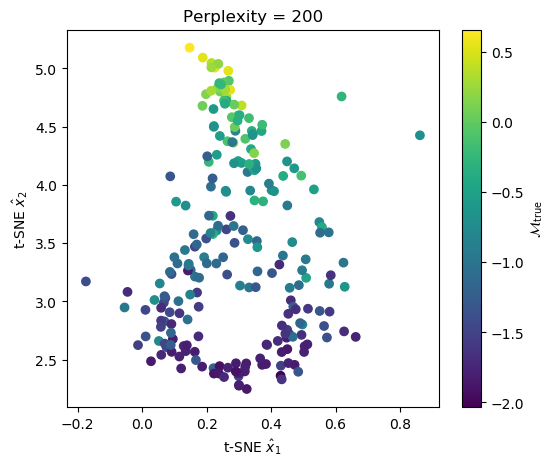

In [175]:
perplexity = 200

valid_acts_tsne = TSNE(n_components=2, perplexity=perplexity).fit_transform(valid_acts)

plt.figure(figsize=(6, 5), dpi=100)
plt.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items)

cb = plt.colorbar()

plt.title(f'Perplexity = {perplexity}')
cb.set_label(r'$\mathcal{M}_{\rm true}$')
plt.xlabel(r't-SNE $\hat x_1$')
plt.ylabel(r't-SNE $\hat x_2$')

plt.show()

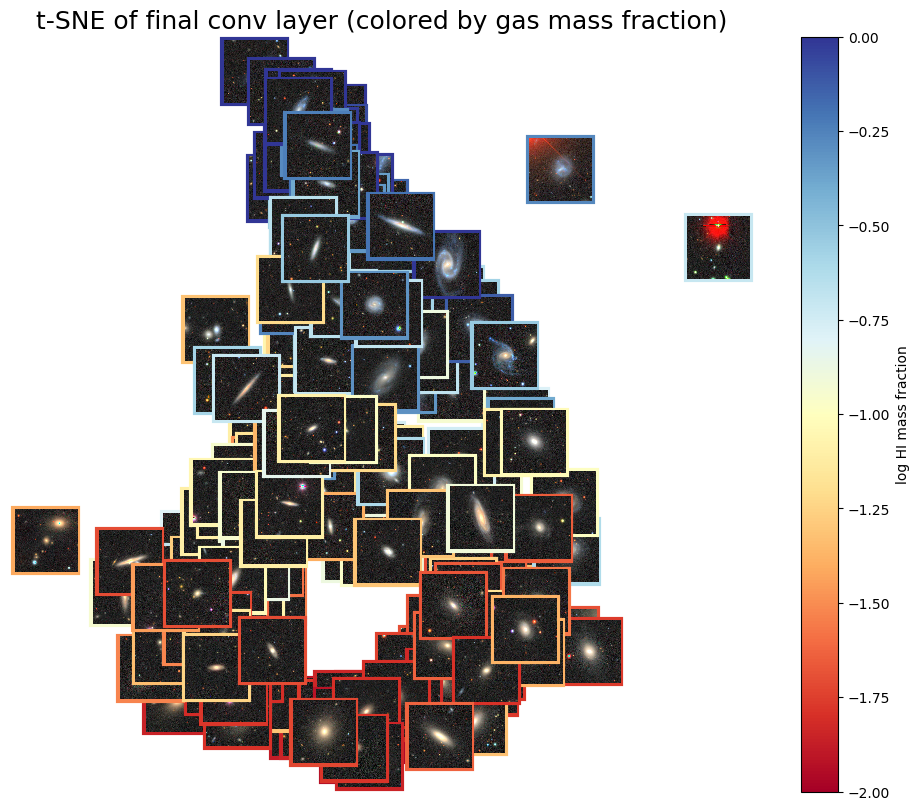

In [176]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10), dpi=100)

sc = ax.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items, 
           vmin=-2, vmax=0, cmap='RdYlBu')


plt.title('t-SNE of final conv layer (colored by gas mass fraction)', fontsize=18)

artists = []
for fname, lgGF, [x, y] in zip(data.valid_dl.items, data.valid_ds.y.items, valid_acts_tsne):
    ab = AnnotationBbox(
        OffsetImage(image2np(open_image(fname).data), zoom=0.1), 
        (x, y), 
        xycoords='data', 
        frameon=True, 
        pad=0.1, 
        bboxprops=dict(linewidth=3, edgecolor=plt.cm.RdYlBu((lgGF/2+1)))
    )
    artists.append(ax.add_artist(ab))
plt.axis('off')
    
plt.colorbar(sc, label='log HI mass fraction')


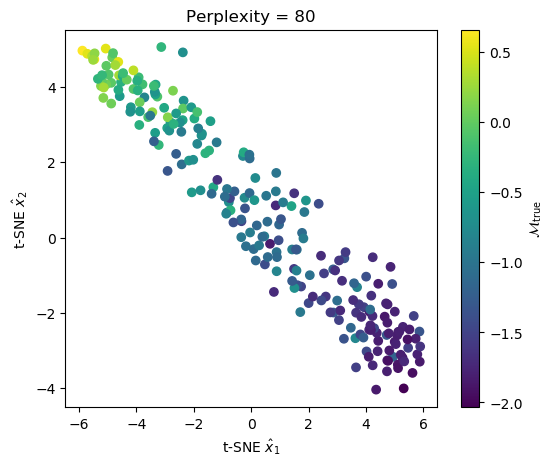

In [177]:
perplexity = 80

valid_acts_tsne = TSNE(n_components=2, perplexity=perplexity).fit_transform(valid_acts)

plt.figure(figsize=(6, 5), dpi=100)
plt.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items)

cb = plt.colorbar()

plt.title(f'Perplexity = {perplexity}')
cb.set_label(r'$\mathcal{M}_{\rm true}$')
plt.xlabel(r't-SNE $\hat x_1$')
plt.ylabel(r't-SNE $\hat x_2$')

plt.show()

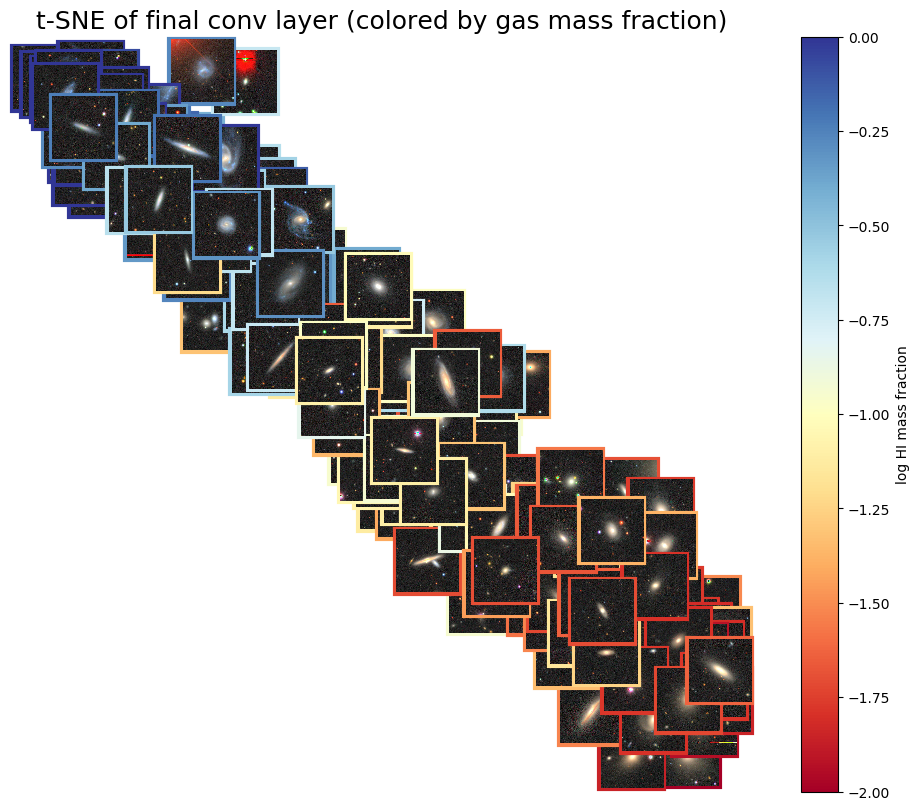

In [178]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10), dpi=100)

sc = ax.scatter(valid_acts_tsne[:, 0], valid_acts_tsne[:, 1], c=data.valid_ds.y.items, 
           vmin=-2, vmax=0, cmap='RdYlBu')


plt.title('t-SNE of final conv layer (colored by gas mass fraction)', fontsize=18)

artists = []
for fname, lgGF, [x, y] in zip(data.valid_dl.items, data.valid_ds.y.items, valid_acts_tsne):
    ab = AnnotationBbox(
        OffsetImage(image2np(open_image(fname).data), zoom=0.1), 
        (x, y), 
        xycoords='data', 
        frameon=True, 
        pad=0.1, 
        bboxprops=dict(linewidth=3, edgecolor=plt.cm.RdYlBu((lgGF/2+1)))
    )
    artists.append(ax.add_artist(ab))
plt.axis('off')
    
plt.colorbar(sc, label='log HI mass fraction')


# PCA final conv layers?

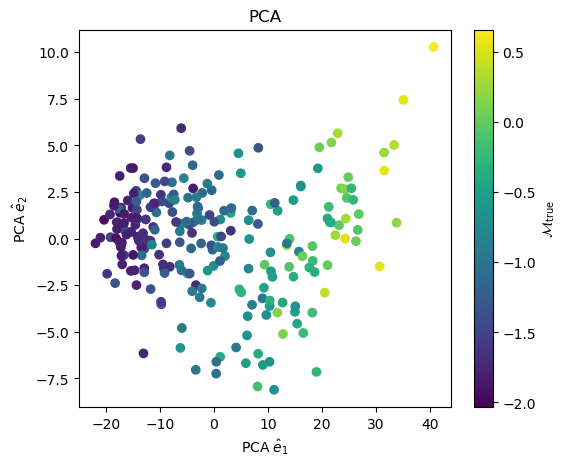

In [180]:
valid_acts_PCA = PCA(n_components=2).fit_transform(valid_acts)

plt.figure(figsize=(6, 5), dpi=100)
plt.scatter(valid_acts_PCA[:, 0], valid_acts_PCA[:, 1], c=data.valid_ds.y.items)

cb = plt.colorbar()

plt.title(f'PCA')
cb.set_label(r'$\mathcal{M}_{\rm true}$')
plt.xlabel(r'PCA $\hat e_1$')
plt.ylabel(r'PCA $\hat e_2$')

plt.show()

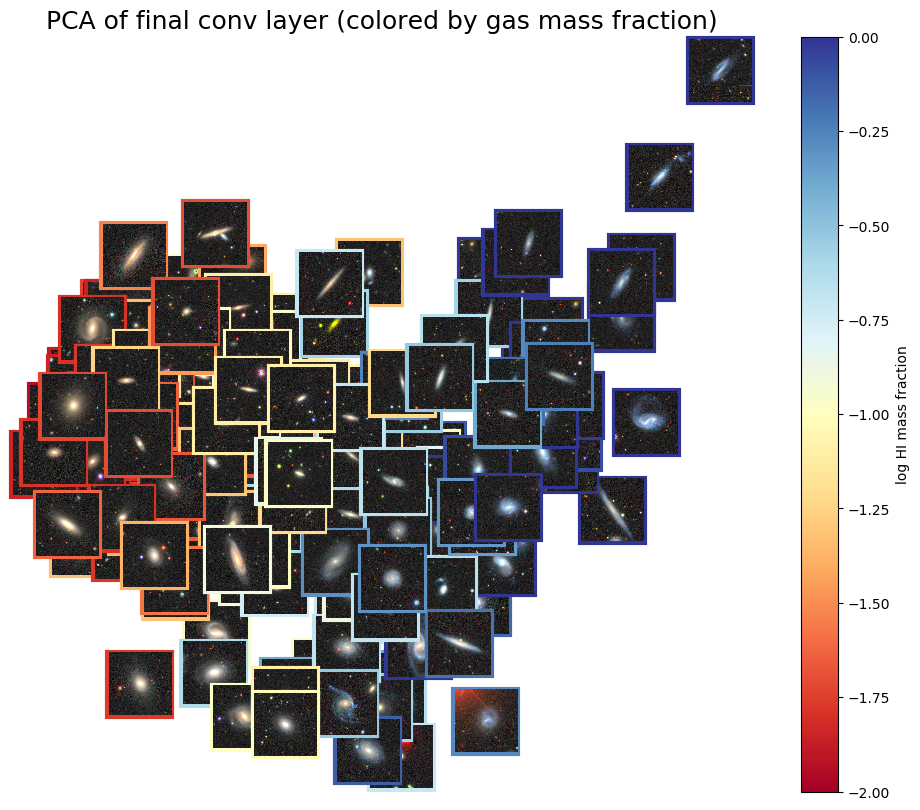

In [181]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10), dpi=100)

sc = ax.scatter(valid_acts_PCA[:, 0], valid_acts_PCA[:, 1], c=data.valid_ds.y.items, 
           vmin=-2, vmax=0, cmap='RdYlBu')


plt.title('PCA of final conv layer (colored by gas mass fraction)', fontsize=18)

artists = []
for fname, lgGF, [x, y] in zip(data.valid_dl.items, data.valid_ds.y.items, valid_acts_PCA):
    ab = AnnotationBbox(
        OffsetImage(image2np(open_image(fname).data), zoom=0.1), 
        (x, y), 
        xycoords='data', 
        frameon=True, 
        pad=0.1, 
        bboxprops=dict(linewidth=3, edgecolor=plt.cm.RdYlBu((lgGF/2+1)))
    )
    artists.append(ax.add_artist(ab))
plt.axis('off')
    
plt.colorbar(sc, label='log HI mass fraction')
